## Import Libraries:

In [1]:
import os 
import datetime 
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf 
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose

## Download the dataset:

In [2]:
zip_path = tf.keras.utils.get_file(origin='https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip',
    fname='jena_climate_2009_2016.csv.zip',
    extract=True)

In [3]:
csv_path , _=os.path.splitext(zip_path)

In [4]:
import os

print(os.listdir(csv_path))

['jena_climate_2009_2016.csv']


In [5]:
csv_path = os.path.join(
    csv_path,
    'jena_climate_2009_2016.csv'
)

df = pd.read_csv(csv_path)

## Understand the dataset:

In [6]:
df.shape

(420551, 15)

In [7]:
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


In [8]:
df[11::12]

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
11,01.01.2009 02:00:00,996.62,-8.88,264.54,-9.77,93.20,3.12,2.90,0.21,1.81,2.91,1312.25,0.25,0.63,190.3
23,01.01.2009 04:00:00,996.99,-9.05,264.34,-10.02,92.60,3.07,2.85,0.23,1.78,2.85,1313.61,0.10,0.38,240.0
35,01.01.2009 06:00:00,997.71,-9.67,263.66,-10.62,92.70,2.93,2.71,0.21,1.69,2.72,1317.71,0.05,0.50,146.0
47,01.01.2009 08:00:00,999.17,-8.10,265.12,-9.05,92.80,3.31,3.07,0.24,1.92,3.08,1311.65,0.72,1.25,213.9
59,01.01.2009 10:00:00,1000.27,-7.04,266.10,-8.17,91.60,3.60,3.30,0.30,2.05,3.29,1307.76,1.45,3.00,292.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420491,31.12.2016 14:10:00,1003.25,4.15,277.05,-3.76,56.20,8.22,4.62,3.60,2.87,4.61,1258.09,0.58,1.32,231.0
420503,31.12.2016 16:10:00,1002.54,2.44,275.40,-4.39,60.50,7.28,4.41,2.88,2.74,4.40,1265.12,0.46,1.08,177.2
420515,31.12.2016 18:10:00,1002.27,-0.42,272.56,-4.92,71.50,5.92,4.23,1.69,2.63,4.22,1278.14,0.44,1.00,232.8
420527,31.12.2016 20:10:00,1001.40,-1.40,271.66,-6.84,66.29,5.51,3.65,1.86,2.27,3.65,1281.87,1.02,1.92,225.4


## Convert Date Time:

In [9]:
date_time = pd.to_datetime(
    df.pop('Date Time'),
    format='%d.%m.%Y %H:%M:%S'
)

In [10]:
date_time.head()

0   2009-01-01 00:10:00
1   2009-01-01 00:20:00
2   2009-01-01 00:30:00
3   2009-01-01 00:40:00
4   2009-01-01 00:50:00
Name: Date Time, dtype: datetime64[ns]

## Visualization:

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

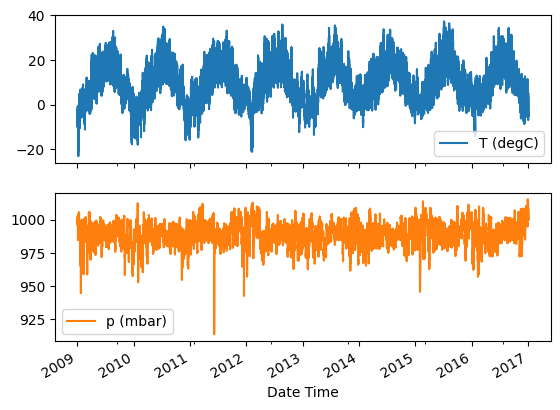

In [11]:
plot_cols = ['T (degC)', 'p (mbar)']

plot_features = df[plot_cols]

plot_features.index = date_time

plot_features.plot(subplots=True)

array([<Axes: xlabel='Date Time'>, <Axes: xlabel='Date Time'>],
      dtype=object)

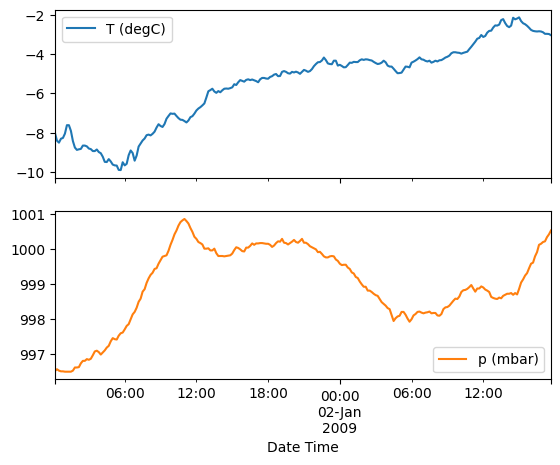

In [12]:
plot_cols = ['T (degC)', 'p (mbar)']

plot_features = df[plot_cols][:250]

plot_features.index = date_time[:250]


plot_features.plot(subplots=True)

## Trend, seasonality and noise:

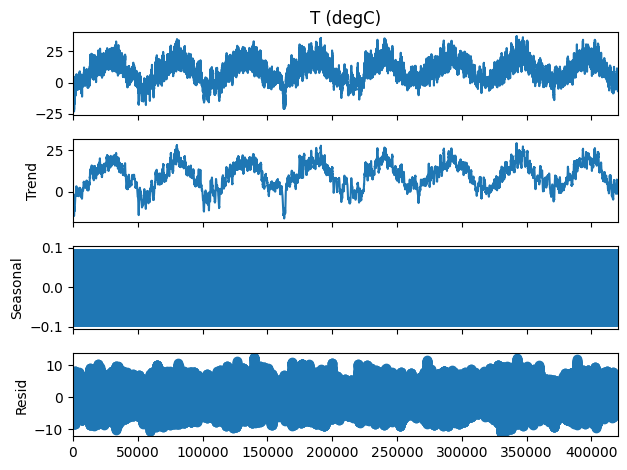

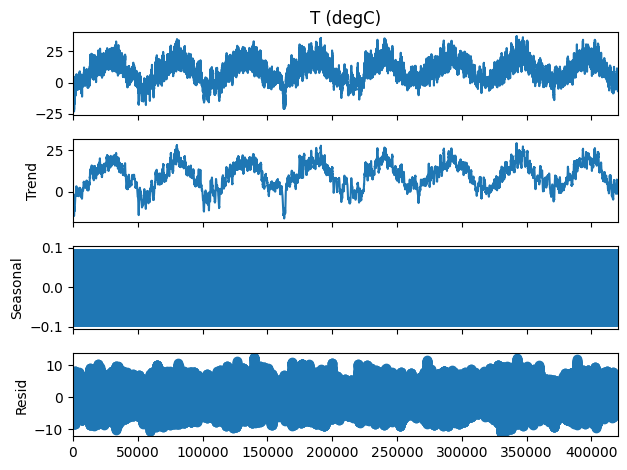

In [13]:
decompose = seasonal_decompose(
    df['T (degC)'],
    model='additive',
    period=365
)

decompose.plot()

## Plotly:

In [14]:
fig = px.line(df, x=date_time, y='T (degC)')
fig.show()

## Train/Test/split:

In [22]:
train_df = df[:24531]

val_df = df[24531:31540]

test_df = df[31540:]

## Normalization:

In [23]:
train_mean = train_df.mean()
train_std = train_df.std()

In [24]:
train_df = (train_df - train_mean) / train_std

val_df = (val_df - train_mean) / train_std

test_df = (test_df - train_mean) / train_std

## tensorflow:

In [16]:
temperature = np.array([10, 12, 14, 16, 18, 20, 22])
dataset = tf.keras.utils.timeseries_dataset_from_array(
    data=temperature,
    targets = temperature[3:],
    sequence_length=3,
    sequence_stride=1,
    batch_size=1
)

## See what TensorFlow actually produced:

In [17]:
for x, y in dataset:
    print("X:", x.numpy())
    print("y:", y.numpy())

X: [[10 12 14]]
y: [16]
X: [[12 14 16]]
y: [18]
X: [[14 16 18]]
y: [20]
X: [[16 18 20]]
y: [22]


## Now apply this to OUR weather data:

actual target is:

In [18]:
df['T (degC)']

0        -8.02
1        -8.41
2        -8.51
3        -8.31
4        -8.27
          ... 
420546   -4.05
420547   -3.35
420548   -3.16
420549   -4.23
420550   -4.82
Name: T (degC), Length: 420551, dtype: float64

In [25]:
temperature = train_df['T (degC)'].values

## Let's start with a simple window:

In [27]:
window_size = 24

train_temperature = train_df['T (degC)'].values

train_ds = tf.keras.utils.timeseries_dataset_from_array(
    data=train_temperature,
    targets=train_temperature[window_size:],
    sequence_length=window_size,
    sequence_stride=1,
    batch_size=32
)

## Check the result:

In [28]:
for X, y in train_ds.take(1):
    print("X shape:", X.shape)
    print("y shape:", y.shape)

X shape: (32, 24)
y shape: (32,)


>32 training examples

****************

> window_size = 24 Use the previous 48 hours to predict the next temperature.

In [29]:
window_size = 24
batch_size = 32

train_temperature = train_df['T (degC)'].values
val_temperature = val_df['T (degC)'].values
test_temperature = test_df['T (degC)'].values

## Create training dataset:

In [30]:
train_ds = tf.keras.utils.timeseries_dataset_from_array(
    data=train_temperature,
    targets=train_temperature[window_size:],
    sequence_length=window_size,
    sequence_stride=1,
    batch_size=batch_size
)

## Validation and test windows:

In [32]:
val_ds = tf.keras.utils.timeseries_dataset_from_array(
    data=val_temperature,
    targets=val_temperature[window_size:],
    sequence_length=window_size,
    sequence_stride=1,
    batch_size=batch_size
)

test_ds = tf.keras.utils.timeseries_dataset_from_array(
    data=test_temperature,
    targets=test_temperature[window_size:],
    sequence_length=window_size,
    sequence_stride=1,
    batch_size=batch_size
)

## Shape:

In [33]:
for X, y in train_ds.take(1):
    print("X shape:", X.shape)
    print("y shape:", y.shape)

X shape: (32, 24)
y shape: (32,)


## Baseline Model:

In [34]:
for X, y in train_ds.take(1):
    baseline_predictions = X[:, -1]
    
    print("Predictions:", baseline_predictions[:5].numpy())
    print("Actual:", y[:5].numpy())

Predictions: [-1.886478   -1.90879715 -1.94103593 -1.94227588 -1.92367659]
Actual: [-1.90879715 -1.94103593 -1.94227588 -1.92367659 -1.93855602]


## Evaluate:

In [35]:
mae = tf.keras.metrics.MeanAbsoluteError()

for X, y in test_ds:
    predictions = X[:, -1]
    mae.update_state(y, predictions)

print("Baseline MAE:", mae.result().numpy())

Baseline MAE: 0.020125521


In [36]:
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(window_size,)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

## Compile:

In [37]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.MeanAbsoluteError(),
    metrics=[tf.keras.metrics.MeanAbsoluteError()]
)

## Train:

In [38]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10


c:\Users\RGB LAPTOPS\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - loss: 0.0928 - mean_absolute_error: 0.0928 - val_loss: 0.1035 - val_mean_absolute_error: 0.1035
Epoch 2/10
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0571 - mean_absolute_error: 0.0571 - val_loss: 0.0756 - val_mean_absolute_error: 0.0756
Epoch 3/10
766/766 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0734 - val_mean_absolute_error: 0.0734
Epoch 4/10
766/766 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0448 - mean_absolute_error: 0.0448 - val_loss: 0.0700 - val_mean_absolute_error: 0.0700
Epoch 5/10
766/766 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0449 - mean_absolute_error: 0.0449 - val_loss: 0.0514 - val_mean_absolute_error: 0.0514
Epoch 6/10
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0464 - mean_absolute_error: 0.0464 - val_loss: 0.0453 - val_mean_absolute_error: 0.0453
Epoch 7/10
766/766 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0405 - mean_absolute_error: 0.0405 - val_loss: 0.

## Evaluate on TEST:

In [39]:
test_loss, test_mae = model.evaluate(test_ds)

print("Test MAE:", test_mae)

12156/12156 ━━━━━━━━━━━━━━━━━━━━ 53s 4ms/step - loss: 0.0468 - mean_absolute_error: 0.0468
Test MAE: 0.04680488258600235


## Prediction:

In [42]:
X_batch, y_batch = next(iter(test_ds))
predictions = model.predict(X_batch, verbose=0).flatten()